# Accessing LATISS Data with the Butler

In [1]:
import os
import numpy as np
import glob
from astropy.io import fits
import pickle as pkl
import matplotlib.pyplot as plt
from lsst.daf.butler import Butler
import lsst.afw.display as afwDisplay
import lsst.afw.image as afwImage
from astropy.table import Table, vstack, join
from scipy import stats
from scipy.optimize import curve_fit
from lsst.obs.lsst import Latiss
camera = Latiss().getCamera()
from matplotlib.pyplot import cm
from scipy import stats
from scipy import interpolate
import matplotlib.ticker as mticker

def display(exposure,title=None):
    afwDisplay.setDefaultBackend('matplotlib') 
    fig = plt.figure(figsize=(10,10))
    afw_display = afwDisplay.Display(1)
    afw_display.scale('asinh', 'zscale')
    afw_display.mtv(exposure.getImage())
    plt.title(title)
    plt.gca().axis('off')

def get_astropy_wcs(image):
    from astropy.wcs import WCS
    print(image.getWcs())
    
    wcs_dict = dict()
    for val in image.getWcs().getFitsMetadata():
        wcs_dict[str(val)] = image.getWcs().getFitsMetadata()[str(val)]

    return WCS(wcs_dict)

##### First we are going to setup a butler to repository where the LATISS data is ingested on USDF.<br>Here wea re just going to pull some raw images from a specific date and time.

##### You can look up on Rubin TV to check which date, or copy the dataID for a specific exposure.<br>
https://roundtable.lsst.codes/rubintv/summit/auxtel/historical/2023-05-23

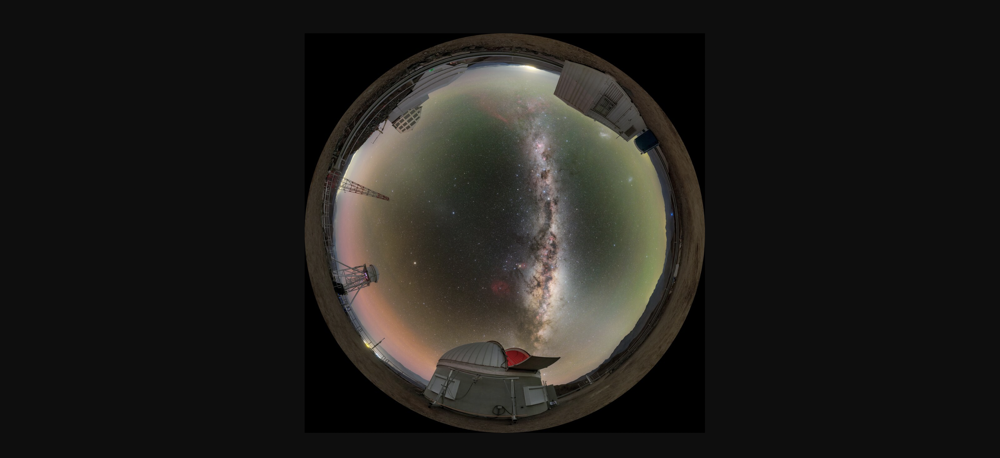

In [2]:
repo_path = "/repo/embargo"
butler = Butler(repo_path)
registry = butler.registry

for c in registry.queryCollections()[:10]:
    print(c)    

LATISS/raw/all
LATISS/calib/DM-28636/curated/19700101T000000Z
LATISS/calib/DM-28636/curated/20180101T000000Z
LATISS/calib/DM-28636/unbounded
refcats/DM-28636
refcats/DM-33444
skymaps
u/czw/DM-28920/biasGen.20210702a/20210702T215049Z
u/czw/DM-28920/darkGen.20210707d/20210707T215331Z
u/czw/DM-28920/defectGen.20210720a/20210720T230634Z


##### We can query the data by date:

In [3]:
expRecords = list(butler.registry.queryDimensionRecords('exposure'))
#expRecords = [r for r in expRecords if 'science' in r.observation_type and str(r.day_obs)[:4] == '2023' and str(r.day_obs)[4:6] == '05']
expRecords = [r for r in expRecords if 'AUXTEL_PHOTO_IMAGING' in r.science_program 
              and str(r.day_obs)[:4] == '2023' 
              and str(r.day_obs)[4:6] == '05' 
              and str(r.day_obs)[6:] == '23']

print(f"Found {len(expRecords)} records")

idlist = [r.id for r in expRecords]

Found 40 records


In [4]:
expRecords = list(butler.registry.queryDimensionRecords('exposure'))
#expRecords = [r for r in expRecords if 'science' in r.observation_type and str(r.day_obs)[:4] == '2023' and str(r.day_obs)[4:6] == '05']
expRecords = [r for r in expRecords if str(r.day_obs)[:4] == '2023' and "SMC" in r.target_name]
              #and str(r.day_obs)[4:6] == '05' 
              #and str(r.day_obs)[6:] == '23']

print(f"Found {len(expRecords)} records")

idlist = [r.id for r in expRecords]

Found 42 records


In [5]:
for r in expRecords:
    print(r.target_name)

SMC_057
SMC_058
SMC_059
SMC_060
SMC_061
SMC_063
SMC_017
SMC_005
SMC_006
SMC_007
SMC_008
SMC_010
SMC_011
SMC_012
SMC_013
SMC_014
SMC_057
SMC_058
SMC_059
SMC_060
SMC_061
SMC_063
SMC_017
SMC_005
SMC_006
SMC_007
SMC_008
SMC_010
SMC_011
SMC_012
SMC_013
SMC_014
SMC_015
SMC_016
SMC_015
SMC_016
SMC_022
SMC_023
SMC_024
SMC_022
SMC_023
SMC_024


In [6]:
print(expRecords[0])

exposure:
  instrument: 'LATISS'
  id: 2023011700125
  physical_filter: 'SDSSr_65mm~empty'
  obs_id: 'AT_O_20230117_000125'
  exposure_time: 30.0
  dark_time: 30.2412
  observation_type: 'science'
  observation_reason: 'object'
  day_obs: 20230117
  seq_num: 125
  seq_start: 125
  seq_end: 126
  group_name: '2023-01-18T00:48:43.154'
  group_id: 2539325231540000
  target_name: 'SMC_057'
  science_program: 'AUXTEL_DRP_IMAGING'
  tracking_ra: 11.745655607935165
  tracking_dec: -72.51747262156145
  sky_angle: 0.014544724212201788
  azimuth: 197.10429840232246
  zenith_angle: 48.866267593286466
  has_simulated: False
  timespan: Timespan(begin=astropy.time.Time('2023-01-18 00:52:20.758985', scale='tai', format='iso'), end=astropy.time.Time('2023-01-18 00:52:51.000000', scale='tai', format='iso'))


##### Now, we are going to search the raw image collection to pull some of the images from the dates we selected.

In [7]:
collections = ['LATISS/raw/all', 'LATISS/calib']

subbutler = Butler(repo_path,collections=collections)
subregistry = subbutler.registry
for dtype in subregistry.queryDatasetTypes()[:10]:
    try:
        datasetRefs = list(subregistry.queryDatasets(datasetType=dtype,collections=collections))        
        print(len(datasetRefs), dtype )
    except:
        print("Error", dtype )

50809 DatasetType('raw', {band, instrument, detector, physical_filter, exposure}, Exposure)
5 DatasetType('bias', {instrument, detector}, ExposureF, isCalibration=True)
1 DatasetType('camera', {instrument}, Camera, isCalibration=True)
5 DatasetType('dark', {instrument, detector}, ExposureF, isCalibration=True)
4 DatasetType('defects', {instrument, detector}, Defects, isCalibration=True)
23 DatasetType('flat', {band, instrument, detector, physical_filter}, ExposureF, isCalibration=True)
0 DatasetType('gaia_dr2_20200414', {htm7}, SimpleCatalog)
0 DatasetType('skyMap', {skymap}, SkyMap)
0 DatasetType('atlas_refcat2_20220201', {htm7}, SimpleCatalog)
0 DatasetType('packages', {}, Packages)


In [8]:
collections = ['LATISS/raw/all', 'LATISS/calib']
datasetRefs = list(subregistry.queryDatasets(
    datasetType='raw',
    collections=collections,
    instrument='LATISS',
    detector=0,
    where = "exposure.id IN (2023011700125) "))

print(len(datasetRefs))

1


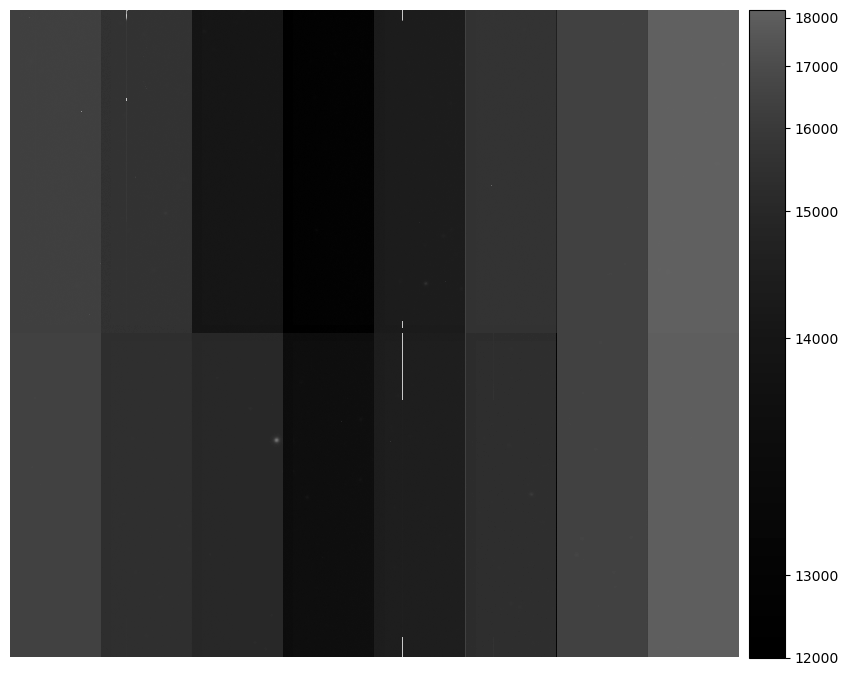

In [9]:
ref = datasetRefs[0]
raw=butler.get('raw',dataId = ref.dataId, collections=collections)

exptime = raw.getMetadata()['EXPTIME']

display(raw)

In [10]:
from lsst.ip.isr.isrTask import IsrTask

config = IsrTask.ConfigClass()
config.doDark = True
config.doBias = True
config.doFlat = False
config.doDefect = True
config.doLinearize=False
config.doBrighterFatter=False
config.doApplyGains=False
config.doOverscan=True
# The images tend to have serial structure ("banding"), 
# and this is the best option to remove it.
config.overscan.fitType='MEDIAN_PER_ROW' 

isrtask = IsrTask(config=config) # default configuration

# Get the calibrations
collections = "LATISS/calib"
bias = butler.get('bias',dataId = {"day_obs": 20230131, "seq_num": 151, "detector": 0},instrument='LATISS', collections=collections)
dark = butler.get('dark',dataId = {"day_obs": 20230523, "seq_num": 45, "detector": 0},instrument='LATISS', collections=collections)
defects = butler.get('defects',dataId = {"day_obs": 20230523, "seq_num": 45, "detector": 0},instrument='LATISS', collections=collections)

postISRStruct = isrtask.run( raw, 
                            camera=camera, 
                            bias=bias, 
                            dark=dark,
                            defects=defects,
                            detectorNum=0)
# Note: the task returns a struct that contains the exposure object
image = postISRStruct.exposure

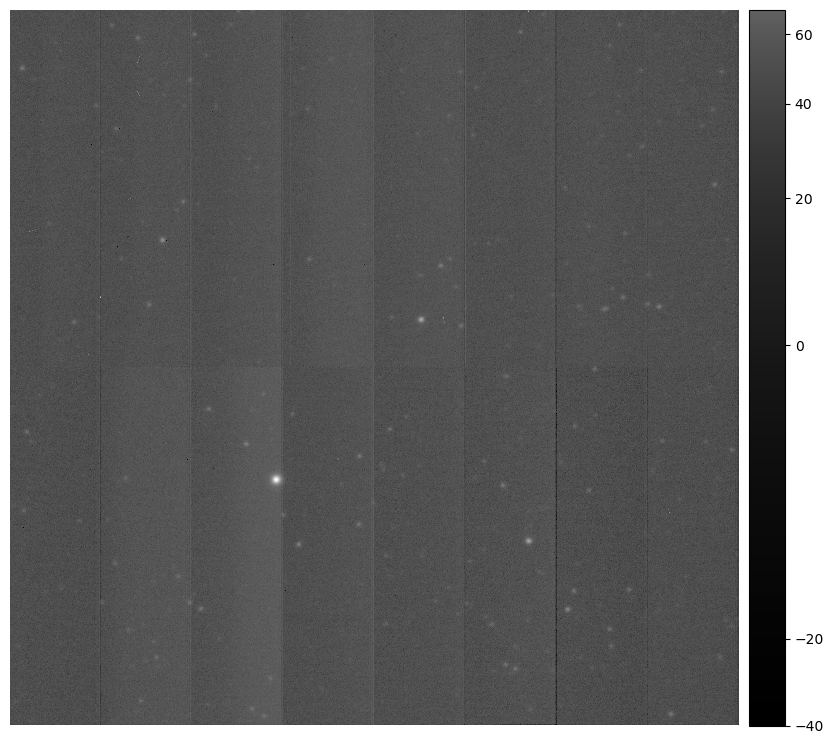

In [11]:
display(image)

In [12]:
image.writeFits("./example_auxtel_image.fits")

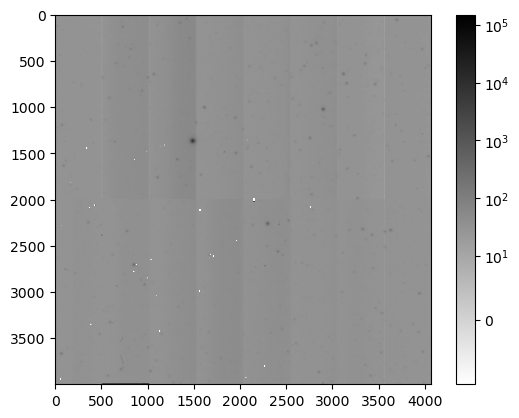

In [13]:
from matplotlib.colors import SymLogNorm
plt.imshow(image.getImage().getArray(), cmap='binary' ,norm=SymLogNorm(10, vmin=-10, vmax=150000, base=10))
plt.colorbar()

## SExtractor-generated catalog

In [18]:
from astropy.stats import sigma_clipped_stats
from photutils.datasets import load_star_image

hdu = fits.open("./example_auxtel_image.fits")
data = hdu[1].data
mean, median, std = sigma_clipped_stats(data, sigma=3.0)  
print((mean, median, std))  


(34.81288, 34.4825, 9.500197)


In [3]:
from astropy.io import fits
hdu = fits.open("./example_auxtel_image.fits")
hdu.info()

Filename: ./example_auxtel_image.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  Segment10     1 PrimaryHDU     495   ()      
  1  IMAGE         1 ImageHDU        34   (4072, 4000)   float32   
  2  MASK          1 ImageHDU        42   (4072, 4000)   int32   
  3  VARIANCE      1 ImageHDU        34   (4072, 4000)   float32   
  4  ARCHIVE_INDEX    1 BinTableHDU     41   10R x 7C   [1J, 1J, 1J, 1J, 1J, 64A, 64A]   
  5  PhotoCalib    1 BinTableHDU     36   1R x 5C   [1X, 1D, 1D, 1J, 1J]   
  6  ChebyshevBoundedField    1 BinTableHDU     41   1R x 6C   [1J, 1J, 1J, 1J, 1J, 1D]   
  7  FilterLabel    1 BinTableHDU     28   1R x 3C   [2X, 32A, 32A]   
  8  SkyWcs        1 BinTableHDU     17   1R x 1C   [1QB(8628)]   
  9  Detector      1 BinTableHDU    115   1R x 22C   [1QA(7), 1J, 1J, 1QA(13), 1J, 1J, 1J, 1J, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1J, 1QE(0), 1QA(3), 1J]   
 10  TransformMap    1 BinTableHDU     33   3R x 5C   [1QA(10), 1QA(7), 1QA(10), 1QA(7), 1

In [19]:
from photutils.detection import DAOStarFinder
daofind = DAOStarFinder(fwhm=3.0, threshold=5.*std)  
sources = daofind(data - median)  

for col in sources.colnames:  
    if col not in ('id', 'npix'):
        sources[col].info.format = '%.2f'  # for consistent table output
sources.pprint(max_width=76)  

 id xcentroid ycentroid sharpness roundness1 ... sky    peak    flux   mag 
--- --------- --------- --------- ---------- ... ---- -------- ------ -----
  1   1643.74    477.71      0.53      -0.22 ... 0.00    33.51   1.02 -0.02
  2    581.13    536.80      0.76       0.37 ... 0.00    35.92   1.01 -0.01
  3   1085.82    536.83      0.76       0.69 ... 0.00    47.20   1.12 -0.12
  4   1089.94    537.06      0.85       0.56 ... 0.00    50.79   1.08 -0.08
  5   3121.86    537.24      0.76       0.17 ... 0.00    48.49   1.28 -0.27
  6   3125.79    537.11      0.67       0.42 ... 0.00    37.04   1.18 -0.18
...       ...       ...       ...        ... ...  ...      ...    ...   ...
 85    716.32   3712.66      0.85       0.84 ... 0.00   432.96   6.39 -2.01
 86    718.34   3718.87      0.65       0.95 ... 0.00   672.22  12.35 -2.73
 87    722.37   3731.05      0.81       0.91 ... 0.00   360.54   5.31 -1.81
 88   3802.26   3965.77      0.84      -0.14 ... 0.00   742.67  12.91 -2.78
 89    974.2

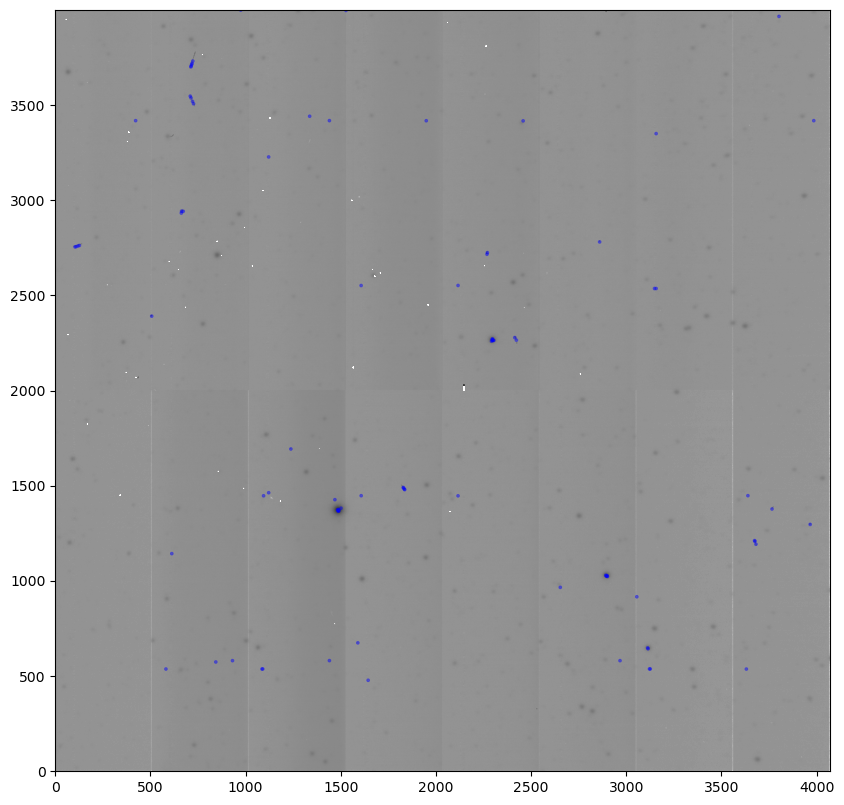

In [24]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.visualization import SqrtStretch
from astropy.visualization.mpl_normalize import ImageNormalize
from photutils.aperture import CircularAperture
positions = np.transpose((sources['xcentroid'], sources['ycentroid']))
apertures = CircularAperture(positions, r=4.0)
norm = ImageNormalize(stretch=SqrtStretch())
plt.figure(figsize=(10,10))
plt.imshow(data, origin='lower', cmap='binary', norm=SymLogNorm(10, vmin=-10, vmax=150000, base=10))
result = apertures.plot(color='blue', lw=1.5, alpha=0.5)

In [27]:
sources.write('example_auxtel_image.fits')

OSError: File example_auxtel_image.fits already exists. If you mean to replace it then use the argument "overwrite=True".

## Mixoatl-generated catalog

In [14]:
sys.path.append('/home/a/abrought/bin')
from mixcoatl.python.mixcoatl import characterizeSpots
config = characterizeSpots.CharacterizeSpotsConfig()
config.thresholdValue=50. # Get only 5 sigma sources 
config.thresholdType='stdev' # Get
findSpotTask = characterizeSpots.CharacterizeSpotsTask(config=config)
catalog = findSpotTask.run(exposure=image)
catalog = catalog.sourceCat
len(catalog)

ModuleNotFoundError: No module named 'mixcoatl'

/home/a/abrought/bin/mixcoatl/python/mixcoatl/characterizeSpots.py:160: FutureWarning: Call to deprecated class ExposureIdInfo. (Deprecated in favor of lsst.meas.base.CatalogIdPacker; will be removed after v27.) -- Deprecated since version v26.
  exposureIdInfo = ExposureIdInfo()


Removed CRs


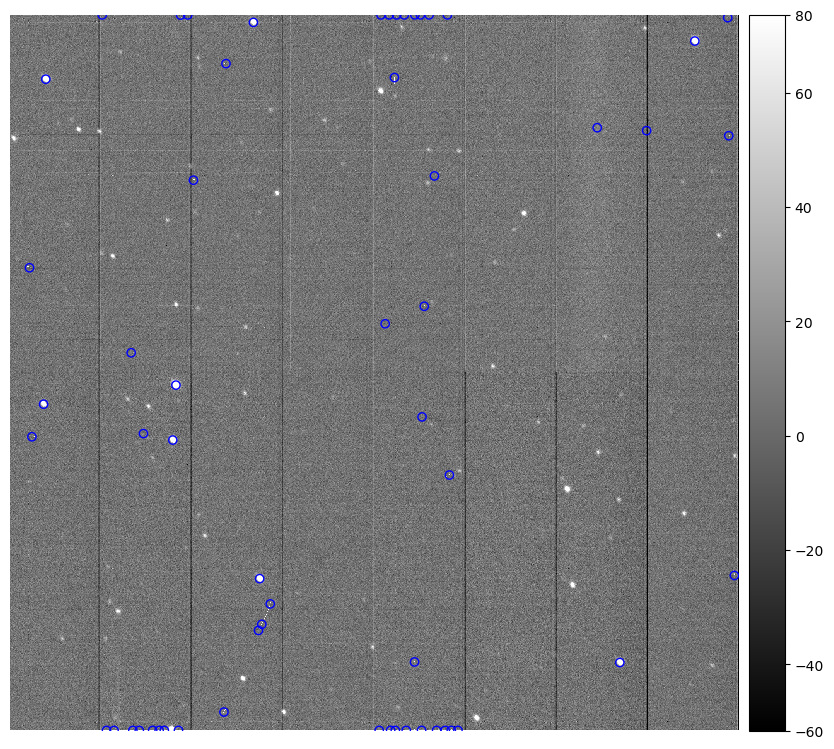

In [17]:
display(image)
plt.scatter(catalog['base_SdssCentroid_x'], catalog['base_SdssCentroid_y'], marker="o",facecolors='none', edgecolors='b')

FITS standard SkyWcs:
Sky Origin: (239.9767113678, -24.0195581165)
Pixel Origin: (2088, 2006)
Pixel Scale: 0.095695 arcsec/pixel


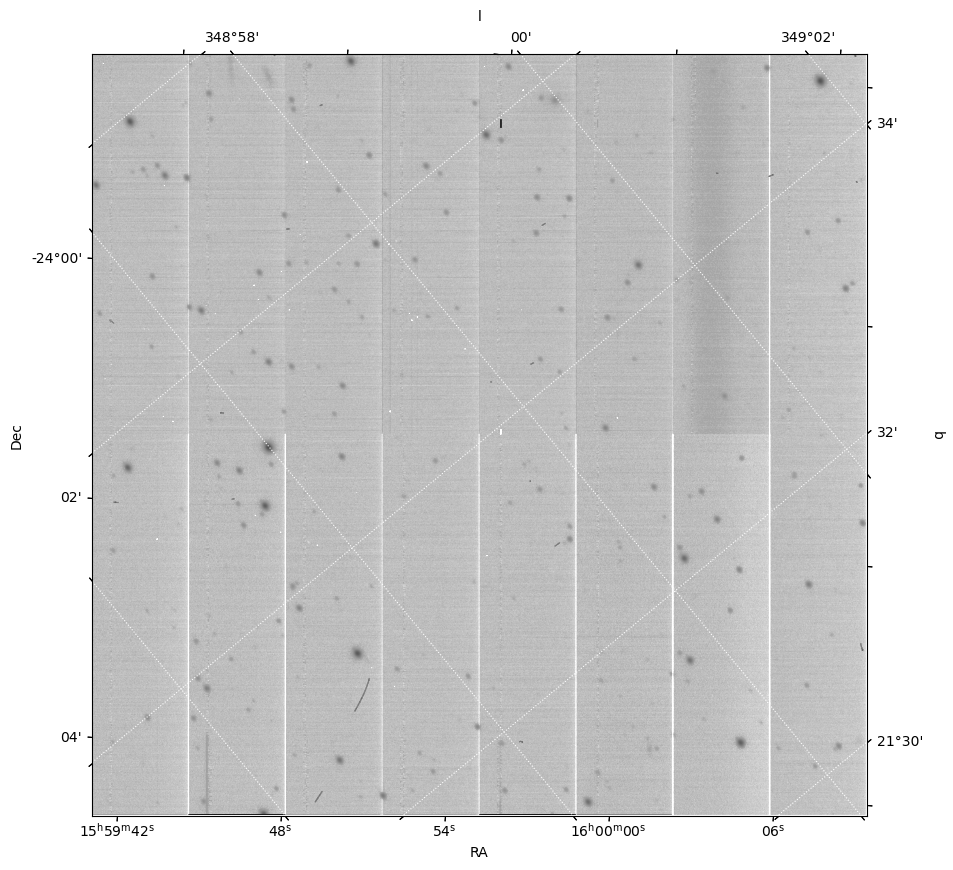

In [18]:
wcs = get_astropy_wcs(image)
fig = plt.figure(figsize=(10, 10))
ax = plt.subplot(projection=wcs)
plt.imshow(image.getImage().getArray(), origin='lower', cmap='binary' ,norm=SymLogNorm(10, vmin=-10, vmax=150000, base=10),aspect='equal')
plt.xlabel(r'RA')
plt.ylabel(r'Dec')
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)

overlay = ax.get_coords_overlay('galactic')
overlay.grid(color='white', ls='dotted')

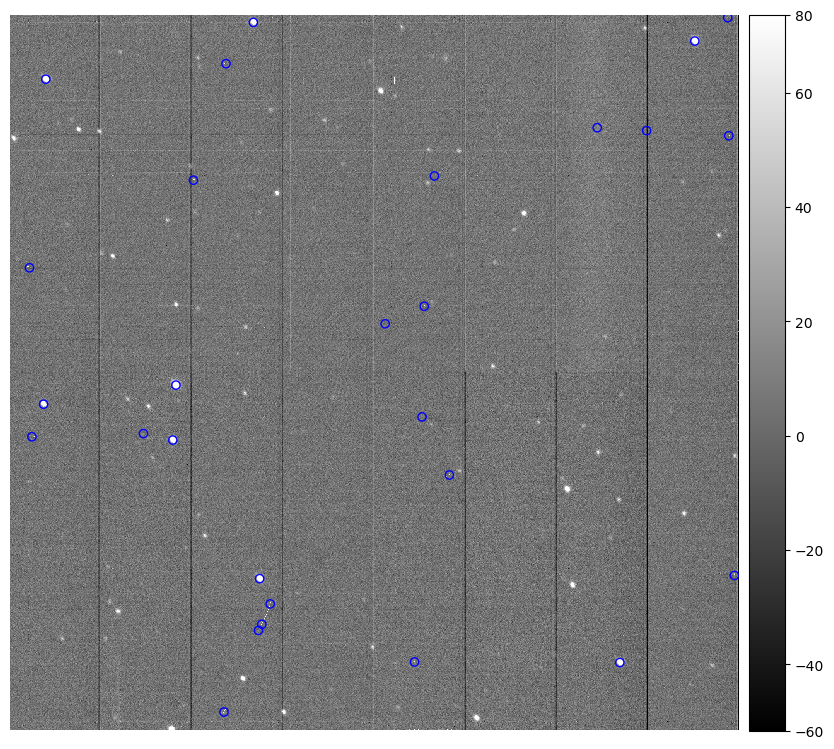

In [21]:
display(image)
plt.scatter(catalog[mask]['base_SdssCentroid_x'], catalog[mask]['base_SdssCentroid_y'], marker="o",facecolors='none', edgecolors='b')

(4000, 4072)
28


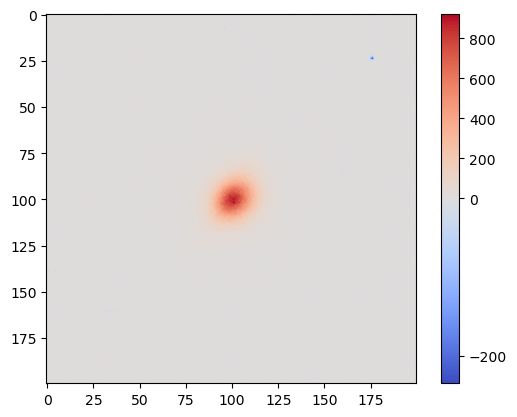

In [32]:
from matplotlib import colors
from astropy.wcs import WCS

x = np.asarray(catalog['base_SdssCentroid_x'][mask])
y = np.asarray(catalog['base_SdssCentroid_y'][mask])
s = 100

img = image.getImage().getArray()
print(img.shape)

print(len(x))

_next_ = 7
_count_ = 0
for i, (x,y) in enumerate(zip(x, y)):

    assert _next_ > 0
    assert type(_next_) == int
    
    if x-s < 0 or y - s < 0 or \
       x+s > 4000 or y + s > 4072 :
        continue
        
    _count_ += 1
    
    if _next_ == _count_:
        indx, indy = int(x), int(y)
        data = img[indy-s:indy+s,indx-s:indx+s]
        plt.imshow(data, cmap="coolwarm", norm=colors.TwoSlopeNorm(vcenter=0.), )
        plt.colorbar()
        break


(-2000.0, 5000.0)

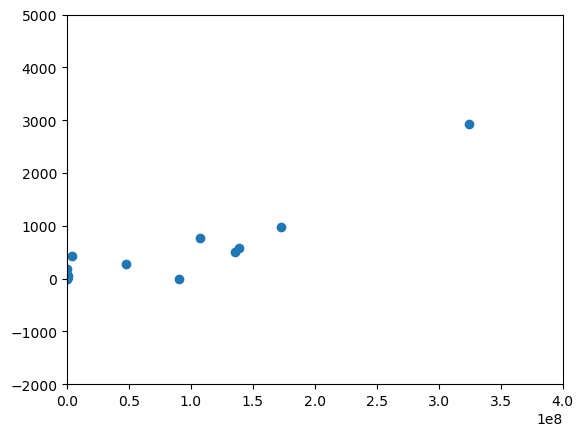

In [29]:
plt.scatter(catalog['base_SdssShape_instFlux'],catalog['base_SdssShape_xx'])
plt.xlim(0,4e8)
plt.ylim(-2000,5000)
#plt.xscale('log')
#plt.yscale('log')

Now we will loop over all exposures to collect as amny "good" stars as we can.

In [48]:
from astropy.table import Table, vstack

def runISR(ref):
    collections = ['LATISS/raw/all', 'LATISS/calib']
    raw = butler.get('raw',dataId = ref.dataId, collections=collections)
    postISRStruct = isrtask.run(raw, 
                                camera=camera, 
                                bias=bias, 
                                dark=dark,
                                defects=defects,
                                detectorNum=0)
    # Note: the task returns a struct that contains the exposure object
    image = postISRStruct.exposure
    
    catalog = findSpotTask.run(exposure=image)
    
    try:
        return catalog.sourceCat.asAstropy()
    except:
        return Table()

In [49]:
result = Table()
for ref in datasetRefs:
    catalog = runISR(ref)
    result = vstack([result,catalog])

/home/a/abrought/bin/mixcoatl/python/mixcoatl/characterizeSpots.py:160: FutureWarning: Call to deprecated class ExposureIdInfo. (Deprecated in favor of lsst.meas.base.CatalogIdPacker; will be removed after v27.) -- Deprecated since version v26.
  exposureIdInfo = ExposureIdInfo()


Removed CRs


/home/a/abrought/bin/mixcoatl/python/mixcoatl/characterizeSpots.py:160: FutureWarning: Call to deprecated class ExposureIdInfo. (Deprecated in favor of lsst.meas.base.CatalogIdPacker; will be removed after v27.) -- Deprecated since version v26.
  exposureIdInfo = ExposureIdInfo()


Removed CRs


/home/a/abrought/bin/mixcoatl/python/mixcoatl/characterizeSpots.py:160: FutureWarning: Call to deprecated class ExposureIdInfo. (Deprecated in favor of lsst.meas.base.CatalogIdPacker; will be removed after v27.) -- Deprecated since version v26.
  exposureIdInfo = ExposureIdInfo()


Removed CRs


/home/a/abrought/bin/mixcoatl/python/mixcoatl/characterizeSpots.py:160: FutureWarning: Call to deprecated class ExposureIdInfo. (Deprecated in favor of lsst.meas.base.CatalogIdPacker; will be removed after v27.) -- Deprecated since version v26.
  exposureIdInfo = ExposureIdInfo()


Removed CRs


/home/a/abrought/bin/mixcoatl/python/mixcoatl/characterizeSpots.py:160: FutureWarning: Call to deprecated class ExposureIdInfo. (Deprecated in favor of lsst.meas.base.CatalogIdPacker; will be removed after v27.) -- Deprecated since version v26.
  exposureIdInfo = ExposureIdInfo()


Removed CRs


/home/a/abrought/bin/mixcoatl/python/mixcoatl/characterizeSpots.py:160: FutureWarning: Call to deprecated class ExposureIdInfo. (Deprecated in favor of lsst.meas.base.CatalogIdPacker; will be removed after v27.) -- Deprecated since version v26.
  exposureIdInfo = ExposureIdInfo()


Removed CRs


/home/a/abrought/bin/mixcoatl/python/mixcoatl/characterizeSpots.py:160: FutureWarning: Call to deprecated class ExposureIdInfo. (Deprecated in favor of lsst.meas.base.CatalogIdPacker; will be removed after v27.) -- Deprecated since version v26.
  exposureIdInfo = ExposureIdInfo()


Removed CRs


/home/a/abrought/bin/mixcoatl/python/mixcoatl/characterizeSpots.py:160: FutureWarning: Call to deprecated class ExposureIdInfo. (Deprecated in favor of lsst.meas.base.CatalogIdPacker; will be removed after v27.) -- Deprecated since version v26.
  exposureIdInfo = ExposureIdInfo()


Removed CRs


/home/a/abrought/bin/mixcoatl/python/mixcoatl/characterizeSpots.py:160: FutureWarning: Call to deprecated class ExposureIdInfo. (Deprecated in favor of lsst.meas.base.CatalogIdPacker; will be removed after v27.) -- Deprecated since version v26.
  exposureIdInfo = ExposureIdInfo()


Removed CRs


/home/a/abrought/bin/mixcoatl/python/mixcoatl/characterizeSpots.py:160: FutureWarning: Call to deprecated class ExposureIdInfo. (Deprecated in favor of lsst.meas.base.CatalogIdPacker; will be removed after v27.) -- Deprecated since version v26.
  exposureIdInfo = ExposureIdInfo()


Removed CRs


/home/a/abrought/bin/mixcoatl/python/mixcoatl/characterizeSpots.py:160: FutureWarning: Call to deprecated class ExposureIdInfo. (Deprecated in favor of lsst.meas.base.CatalogIdPacker; will be removed after v27.) -- Deprecated since version v26.
  exposureIdInfo = ExposureIdInfo()


Removed CRs


/home/a/abrought/bin/mixcoatl/python/mixcoatl/characterizeSpots.py:160: FutureWarning: Call to deprecated class ExposureIdInfo. (Deprecated in favor of lsst.meas.base.CatalogIdPacker; will be removed after v27.) -- Deprecated since version v26.
  exposureIdInfo = ExposureIdInfo()


Removed CRs


/home/a/abrought/bin/mixcoatl/python/mixcoatl/characterizeSpots.py:160: FutureWarning: Call to deprecated class ExposureIdInfo. (Deprecated in favor of lsst.meas.base.CatalogIdPacker; will be removed after v27.) -- Deprecated since version v26.
  exposureIdInfo = ExposureIdInfo()


Removed CRs


/home/a/abrought/bin/mixcoatl/python/mixcoatl/characterizeSpots.py:160: FutureWarning: Call to deprecated class ExposureIdInfo. (Deprecated in favor of lsst.meas.base.CatalogIdPacker; will be removed after v27.) -- Deprecated since version v26.
  exposureIdInfo = ExposureIdInfo()


Removed CRs


/home/a/abrought/bin/mixcoatl/python/mixcoatl/characterizeSpots.py:160: FutureWarning: Call to deprecated class ExposureIdInfo. (Deprecated in favor of lsst.meas.base.CatalogIdPacker; will be removed after v27.) -- Deprecated since version v26.
  exposureIdInfo = ExposureIdInfo()


Removed CRs


/home/a/abrought/bin/mixcoatl/python/mixcoatl/characterizeSpots.py:160: FutureWarning: Call to deprecated class ExposureIdInfo. (Deprecated in favor of lsst.meas.base.CatalogIdPacker; will be removed after v27.) -- Deprecated since version v26.
  exposureIdInfo = ExposureIdInfo()


Removed CRs


/home/a/abrought/bin/mixcoatl/python/mixcoatl/characterizeSpots.py:160: FutureWarning: Call to deprecated class ExposureIdInfo. (Deprecated in favor of lsst.meas.base.CatalogIdPacker; will be removed after v27.) -- Deprecated since version v26.
  exposureIdInfo = ExposureIdInfo()


Removed CRs


/home/a/abrought/bin/mixcoatl/python/mixcoatl/characterizeSpots.py:160: FutureWarning: Call to deprecated class ExposureIdInfo. (Deprecated in favor of lsst.meas.base.CatalogIdPacker; will be removed after v27.) -- Deprecated since version v26.
  exposureIdInfo = ExposureIdInfo()


Removed CRs


/home/a/abrought/bin/mixcoatl/python/mixcoatl/characterizeSpots.py:160: FutureWarning: Call to deprecated class ExposureIdInfo. (Deprecated in favor of lsst.meas.base.CatalogIdPacker; will be removed after v27.) -- Deprecated since version v26.
  exposureIdInfo = ExposureIdInfo()


Removed CRs


/home/a/abrought/bin/mixcoatl/python/mixcoatl/characterizeSpots.py:160: FutureWarning: Call to deprecated class ExposureIdInfo. (Deprecated in favor of lsst.meas.base.CatalogIdPacker; will be removed after v27.) -- Deprecated since version v26.
  exposureIdInfo = ExposureIdInfo()


Removed CRs


/home/a/abrought/bin/mixcoatl/python/mixcoatl/characterizeSpots.py:160: FutureWarning: Call to deprecated class ExposureIdInfo. (Deprecated in favor of lsst.meas.base.CatalogIdPacker; will be removed after v27.) -- Deprecated since version v26.
  exposureIdInfo = ExposureIdInfo()


Removed CRs


/home/a/abrought/bin/mixcoatl/python/mixcoatl/characterizeSpots.py:160: FutureWarning: Call to deprecated class ExposureIdInfo. (Deprecated in favor of lsst.meas.base.CatalogIdPacker; will be removed after v27.) -- Deprecated since version v26.
  exposureIdInfo = ExposureIdInfo()


Removed CRs


/home/a/abrought/bin/mixcoatl/python/mixcoatl/characterizeSpots.py:160: FutureWarning: Call to deprecated class ExposureIdInfo. (Deprecated in favor of lsst.meas.base.CatalogIdPacker; will be removed after v27.) -- Deprecated since version v26.
  exposureIdInfo = ExposureIdInfo()


Removed CRs


/home/a/abrought/bin/mixcoatl/python/mixcoatl/characterizeSpots.py:160: FutureWarning: Call to deprecated class ExposureIdInfo. (Deprecated in favor of lsst.meas.base.CatalogIdPacker; will be removed after v27.) -- Deprecated since version v26.
  exposureIdInfo = ExposureIdInfo()


Removed CRs


/home/a/abrought/bin/mixcoatl/python/mixcoatl/characterizeSpots.py:160: FutureWarning: Call to deprecated class ExposureIdInfo. (Deprecated in favor of lsst.meas.base.CatalogIdPacker; will be removed after v27.) -- Deprecated since version v26.
  exposureIdInfo = ExposureIdInfo()


Removed CRs


/home/a/abrought/bin/mixcoatl/python/mixcoatl/characterizeSpots.py:160: FutureWarning: Call to deprecated class ExposureIdInfo. (Deprecated in favor of lsst.meas.base.CatalogIdPacker; will be removed after v27.) -- Deprecated since version v26.
  exposureIdInfo = ExposureIdInfo()


Removed CRs


/home/a/abrought/bin/mixcoatl/python/mixcoatl/characterizeSpots.py:160: FutureWarning: Call to deprecated class ExposureIdInfo. (Deprecated in favor of lsst.meas.base.CatalogIdPacker; will be removed after v27.) -- Deprecated since version v26.
  exposureIdInfo = ExposureIdInfo()


Removed CRs


/home/a/abrought/bin/mixcoatl/python/mixcoatl/characterizeSpots.py:160: FutureWarning: Call to deprecated class ExposureIdInfo. (Deprecated in favor of lsst.meas.base.CatalogIdPacker; will be removed after v27.) -- Deprecated since version v26.
  exposureIdInfo = ExposureIdInfo()


Removed CRs


/home/a/abrought/bin/mixcoatl/python/mixcoatl/characterizeSpots.py:160: FutureWarning: Call to deprecated class ExposureIdInfo. (Deprecated in favor of lsst.meas.base.CatalogIdPacker; will be removed after v27.) -- Deprecated since version v26.
  exposureIdInfo = ExposureIdInfo()


Removed CRs


/home/a/abrought/bin/mixcoatl/python/mixcoatl/characterizeSpots.py:160: FutureWarning: Call to deprecated class ExposureIdInfo. (Deprecated in favor of lsst.meas.base.CatalogIdPacker; will be removed after v27.) -- Deprecated since version v26.
  exposureIdInfo = ExposureIdInfo()


Removed CRs


/home/a/abrought/bin/mixcoatl/python/mixcoatl/characterizeSpots.py:160: FutureWarning: Call to deprecated class ExposureIdInfo. (Deprecated in favor of lsst.meas.base.CatalogIdPacker; will be removed after v27.) -- Deprecated since version v26.
  exposureIdInfo = ExposureIdInfo()


Removed CRs


/home/a/abrought/bin/mixcoatl/python/mixcoatl/characterizeSpots.py:160: FutureWarning: Call to deprecated class ExposureIdInfo. (Deprecated in favor of lsst.meas.base.CatalogIdPacker; will be removed after v27.) -- Deprecated since version v26.
  exposureIdInfo = ExposureIdInfo()


Removed CRs


/home/a/abrought/bin/mixcoatl/python/mixcoatl/characterizeSpots.py:160: FutureWarning: Call to deprecated class ExposureIdInfo. (Deprecated in favor of lsst.meas.base.CatalogIdPacker; will be removed after v27.) -- Deprecated since version v26.
  exposureIdInfo = ExposureIdInfo()


Removed CRs


/home/a/abrought/bin/mixcoatl/python/mixcoatl/characterizeSpots.py:160: FutureWarning: Call to deprecated class ExposureIdInfo. (Deprecated in favor of lsst.meas.base.CatalogIdPacker; will be removed after v27.) -- Deprecated since version v26.
  exposureIdInfo = ExposureIdInfo()


Removed CRs


/home/a/abrought/bin/mixcoatl/python/mixcoatl/characterizeSpots.py:160: FutureWarning: Call to deprecated class ExposureIdInfo. (Deprecated in favor of lsst.meas.base.CatalogIdPacker; will be removed after v27.) -- Deprecated since version v26.
  exposureIdInfo = ExposureIdInfo()


Removed CRs


/home/a/abrought/bin/mixcoatl/python/mixcoatl/characterizeSpots.py:160: FutureWarning: Call to deprecated class ExposureIdInfo. (Deprecated in favor of lsst.meas.base.CatalogIdPacker; will be removed after v27.) -- Deprecated since version v26.
  exposureIdInfo = ExposureIdInfo()


Removed CRs


/home/a/abrought/bin/mixcoatl/python/mixcoatl/characterizeSpots.py:160: FutureWarning: Call to deprecated class ExposureIdInfo. (Deprecated in favor of lsst.meas.base.CatalogIdPacker; will be removed after v27.) -- Deprecated since version v26.
  exposureIdInfo = ExposureIdInfo()


Removed CRs


/home/a/abrought/bin/mixcoatl/python/mixcoatl/characterizeSpots.py:160: FutureWarning: Call to deprecated class ExposureIdInfo. (Deprecated in favor of lsst.meas.base.CatalogIdPacker; will be removed after v27.) -- Deprecated since version v26.
  exposureIdInfo = ExposureIdInfo()


Removed CRs


/home/a/abrought/bin/mixcoatl/python/mixcoatl/characterizeSpots.py:160: FutureWarning: Call to deprecated class ExposureIdInfo. (Deprecated in favor of lsst.meas.base.CatalogIdPacker; will be removed after v27.) -- Deprecated since version v26.
  exposureIdInfo = ExposureIdInfo()


Removed CRs


/home/a/abrought/bin/mixcoatl/python/mixcoatl/characterizeSpots.py:160: FutureWarning: Call to deprecated class ExposureIdInfo. (Deprecated in favor of lsst.meas.base.CatalogIdPacker; will be removed after v27.) -- Deprecated since version v26.
  exposureIdInfo = ExposureIdInfo()


Removed CRs


(-2000.0, 5000.0)

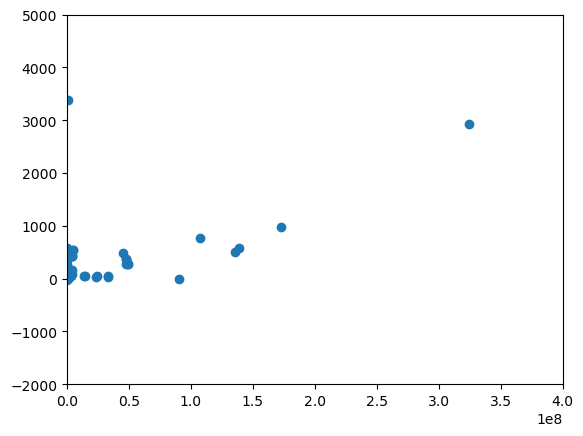

In [53]:
plt.scatter(result['base_SdssShape_instFlux'],result['base_SdssShape_xx'])
plt.xlim(0,4e8)
plt.ylim(-2000,5000)
#plt.xscale('log')
#plt.yscale('log')

In [55]:
mask = (result['base_SdssShape_instFlux'] >0) * (result['base_SdssShape_instFlux']<4e8) * (result['base_SdssShape_xx'] > -2000) * (result['base_SdssShape_xx'] < 5000)

In [56]:
result[mask]

id,coord_ra,coord_dec,parent,base_SdssCentroid_x,slot_Centroid_x,base_SdssCentroid_y,slot_Centroid_y,base_SdssCentroid_xErr,slot_Centroid_xErr,base_SdssCentroid_yErr,slot_Centroid_yErr,base_SdssCentroid_flag,base_CircularApertureFlux_flag_badCentroid,base_GaussianFlux_flag_badCentroid,base_PsfFlux_flag_badCentroid,base_SdssShape_flag_badCentroid,ext_shapeHSM_HsmPsfMoments_flag_badCentroid,ext_shapeHSM_HsmShapeBj_flag_badCentroid,ext_shapeHSM_HsmShapeKsb_flag_badCentroid,ext_shapeHSM_HsmShapeLinear_flag_badCentroid,ext_shapeHSM_HsmShapeRegauss_flag_badCentroid,ext_shapeHSM_HsmSourceMoments_flag_badCentroid,slot_Centroid_flag,base_SdssCentroid_flag_edge,base_CircularApertureFlux_flag_badCentroid_edge,base_GaussianFlux_flag_badCentroid_edge,base_PsfFlux_flag_badCentroid_edge,base_SdssShape_flag_badCentroid_edge,ext_shapeHSM_HsmPsfMoments_flag_badCentroid_edge,ext_shapeHSM_HsmShapeBj_flag_badCentroid_edge,ext_shapeHSM_HsmShapeKsb_flag_badCentroid_edge,ext_shapeHSM_HsmShapeLinear_flag_badCentroid_edge,ext_shapeHSM_HsmShapeRegauss_flag_badCentroid_edge,ext_shapeHSM_HsmSourceMoments_flag_badCentroid_edge,slot_Centroid_flag_edge,base_SdssCentroid_flag_noSecondDerivative,base_CircularApertureFlux_flag_badCentroid_noSecondDerivative,base_GaussianFlux_flag_badCentroid_noSecondDerivative,base_PsfFlux_flag_badCentroid_noSecondDerivative,base_SdssShape_flag_badCentroid_noSecondDerivative,ext_shapeHSM_HsmPsfMoments_flag_badCentroid_noSecondDerivative,ext_shapeHSM_HsmShapeBj_flag_badCentroid_noSecondDerivative,ext_shapeHSM_HsmShapeKsb_flag_badCentroid_noSecondDerivative,ext_shapeHSM_HsmShapeLinear_flag_badCentroid_noSecondDerivative,ext_shapeHSM_HsmShapeRegauss_flag_badCentroid_noSecondDerivative,ext_shapeHSM_HsmSourceMoments_flag_badCentroid_noSecondDerivative,slot_Centroid_flag_noSecondDerivative,base_SdssCentroid_flag_almostNoSecondDerivative,base_CircularApertureFlux_flag_badCentroid_almostNoSecondDerivative,base_GaussianFlux_flag_badCentroid_almostNoSecondDerivative,base_PsfFlux_flag_badCentroid_almostNoSecondDerivative,base_SdssShape_flag_badCentroid_almostNoSecondDerivative,ext_shapeHSM_HsmPsfMoments_flag_badCentroid_almostNoSecondDerivative,ext_shapeHSM_HsmShapeBj_flag_badCentroid_almostNoSecondDerivative,ext_shapeHSM_HsmShapeKsb_flag_badCentroid_almostNoSecondDerivative,ext_shapeHSM_HsmShapeLinear_flag_badCentroid_almostNoSecondDerivative,ext_shapeHSM_HsmShapeRegauss_flag_badCentroid_almostNoSecondDerivative,ext_shapeHSM_HsmSourceMoments_flag_badCentroid_almostNoSecondDerivative,slot_Centroid_flag_almostNoSecondDerivative,base_SdssCentroid_flag_notAtMaximum,base_CircularApertureFlux_flag_badCentroid_notAtMaximum,base_GaussianFlux_flag_badCentroid_notAtMaximum,base_PsfFlux_flag_badCentroid_notAtMaximum,base_SdssShape_flag_badCentroid_notAtMaximum,ext_shapeHSM_HsmPsfMoments_flag_badCentroid_notAtMaximum,ext_shapeHSM_HsmShapeBj_flag_badCentroid_notAtMaximum,ext_shapeHSM_HsmShapeKsb_flag_badCentroid_notAtMaximum,ext_shapeHSM_HsmShapeLinear_flag_badCentroid_notAtMaximum,ext_shapeHSM_HsmShapeRegauss_flag_badCentroid_notAtMaximum,ext_shapeHSM_HsmSourceMoments_flag_badCentroid_notAtMaximum,slot_Centroid_flag_notAtMaximum,base_SdssCentroid_flag_near_edge,base_CircularApertureFlux_flag_badCentroid_near_edge,base_GaussianFlux_flag_badCentroid_near_edge,base_PsfFlux_flag_badCentroid_near_edge,base_SdssShape_flag_badCentroid_near_edge,ext_shapeHSM_HsmPsfMoments_flag_badCentroid_near_edge,ext_shapeHSM_HsmShapeBj_flag_badCentroid_near_edge,ext_shapeHSM_HsmShapeKsb_flag_badCentroid_near_edge,ext_shapeHSM_HsmShapeLinear_flag_badCentroid_near_edge,ext_shapeHSM_HsmShapeRegauss_flag_badCentroid_near_edge,ext_shapeHSM_HsmSourceMoments_flag_badCentroid_near_edge,slot_Centroid_flag_near_edge,base_SdssCentroid_flag_resetToPeak,base_CircularApertureFlux_flag_badCentroid_resetToPeak,base_GaussianFlux_flag_badCentroid_resetToPeak,base_PsfFlux_flag_badCentroid_resetToPeak,base_SdssShape_flag_badCentroid_resetToPeak,ext_shapeHSM_HsmPsfMoments_flag_badCentroid_re

In [94]:
collections = ['LATISS/raw/all', 'LATISS/calib']
datasetRefs = []
for month in [1,2,3,4,5]:
    for day in range(1,30):
        dayObs = 20230000 + month * 100 + day
        for record in butler.registry.queryDimensionRecords("exposure", instrument='LATISS', where="exposure.day_obs=%d"%dayObs):
            if 'SMC' in record.target_name:
                
                datasetRef = list(subregistry.queryDatasets( datasetType='raw',
                                                        collections=collections,
                                                        instrument='LATISS',
                                                        detector=0,
                                                        exposure=record.id))[0]
                datasetRefs.append(datasetRef)

                print(record.id, record.target_name)

2023011700125 SMC_057
2023011700127 SMC_058
2023011700129 SMC_059
2023011700131 SMC_060
2023011700133 SMC_061
2023011700135 SMC_063
2023011700137 SMC_017
2023011700139 SMC_005
2023011700141 SMC_006
2023011700143 SMC_007
2023011700145 SMC_008
2023011700147 SMC_010
2023011700149 SMC_011
2023011700151 SMC_012
2023011700153 SMC_013
2023011700155 SMC_014
2023011700126 SMC_057
2023011700128 SMC_058
2023011700130 SMC_059
2023011700132 SMC_060
2023011700134 SMC_061
2023011700136 SMC_063
2023011700138 SMC_017
2023011700140 SMC_005
2023011700142 SMC_006
2023011700144 SMC_007
2023011700146 SMC_008
2023011700148 SMC_010
2023011700150 SMC_011
2023011700152 SMC_012
2023011700154 SMC_013
2023011700156 SMC_014
2023011700158 SMC_015
2023011700160 SMC_016
2023011700157 SMC_015
2023011700159 SMC_016
2023011700161 SMC_022
2023011700163 SMC_023
2023011700165 SMC_024
2023011700162 SMC_022
2023011700164 SMC_023
2023011700166 SMC_024


In [95]:
ref = datasetRefs[0]
raw = butler.get('raw',dataId = ref.dataId, collections=collections)


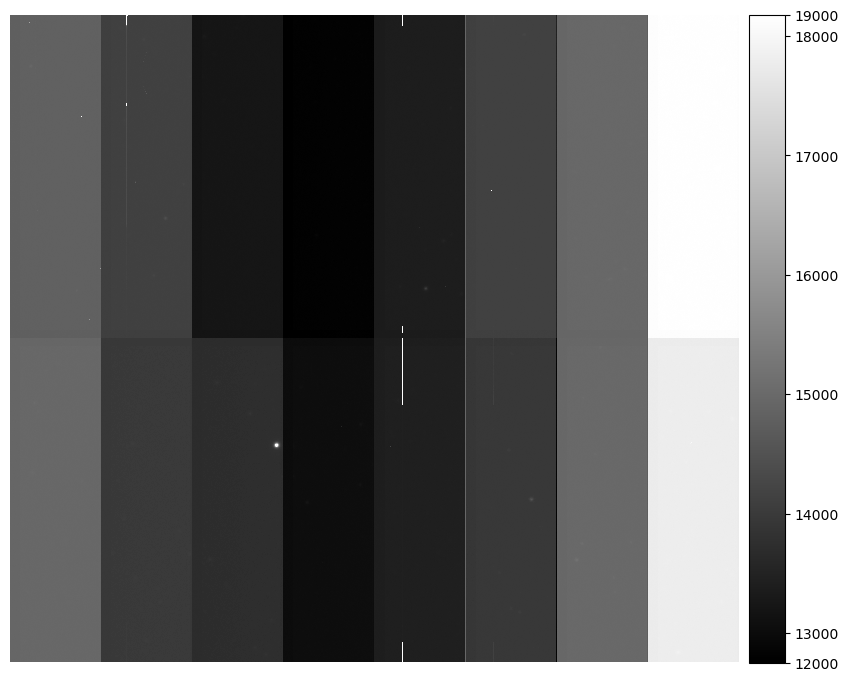

In [96]:
display(raw)

In [97]:
from lsst.ip.isr.isrTask import IsrTask

config = IsrTask.ConfigClass()
config.doDark = True
config.doBias = True
config.doFlat = False
config.doDefect = True
config.doLinearize=False
config.doBrighterFatter=False
config.doApplyGains=False
config.doOverscan=True
# The images tend to have serial structure ("banding"), 
# and this is the best option to remove it.
config.overscan.fitType='MEDIAN_PER_ROW' 

isrtask = IsrTask(config=config) # default configuration

# Get the calibrations
collections = "LATISS/calib"
bias = butler.get('bias',dataId = {"day_obs": 20230131, "seq_num": 151, "detector": 0},instrument='LATISS', collections=collections)
dark = butler.get('dark',dataId = {"day_obs": 20230523, "seq_num": 45, "detector": 0},instrument='LATISS', collections=collections)
defects = butler.get('defects',dataId = {"day_obs": 20230523, "seq_num": 45, "detector": 0},instrument='LATISS', collections=collections)

postISRStruct = isrtask.run( raw, 
                            camera=camera, 
                            bias=bias, 
                            dark=dark,
                            defects=defects,
                            detectorNum=0)
# Note: the task returns a struct that contains the exposure object
image = postISRStruct.exposure

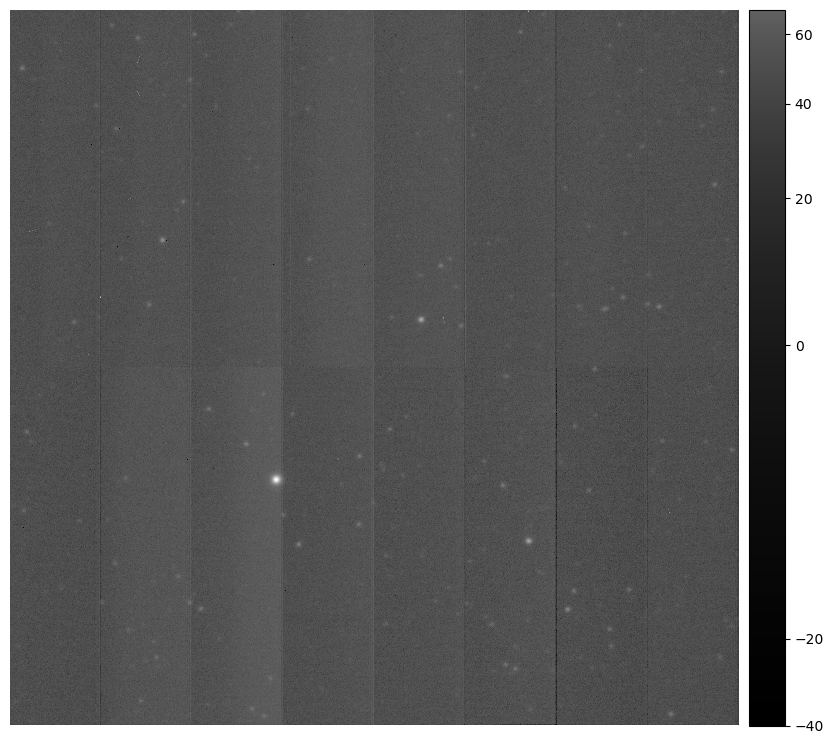

In [110]:
display(image)

FITS standard SkyWcs:
Sky Origin: (11.7456556079, -72.5174726216)
Pixel Origin: (2088, 2006)
Pixel Scale: 0.095695 arcsec/pixel


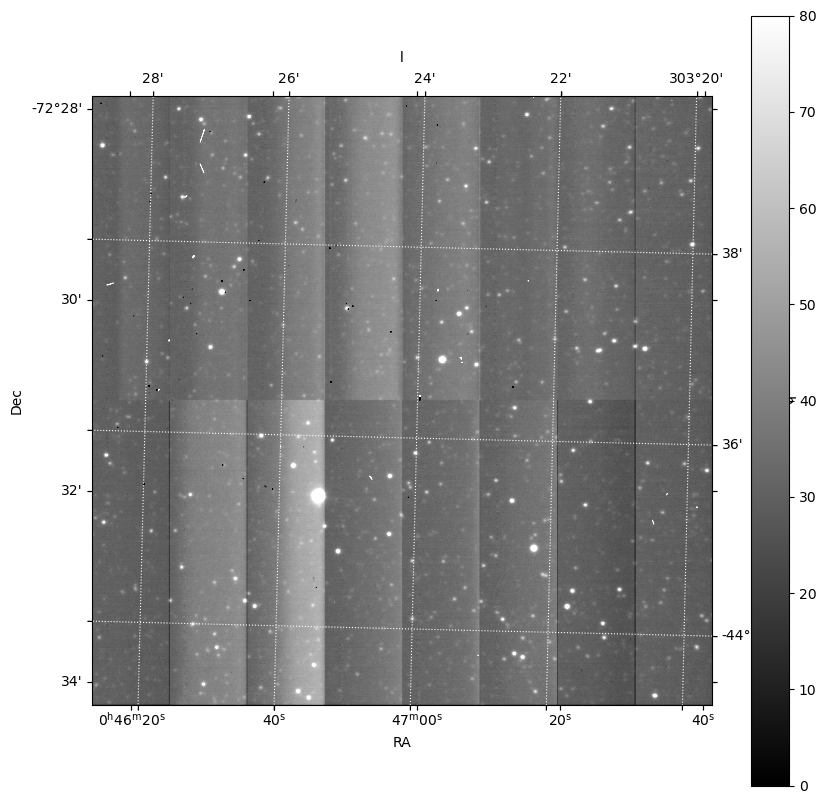

In [115]:
wcs = get_astropy_wcs(image)
fig = plt.figure(figsize=(10, 10))
ax = plt.subplot(projection=wcs)
plt.imshow(image.getImage().getArray(), origin='lower', cmap='binary_r', vmin=0, vmax=80,aspect='equal')
plt.xlabel(r'RA')
plt.ylabel(r'Dec')
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
plt.colorbar()
overlay = ax.get_coords_overlay('galactic')
overlay.grid(color='white', ls='dotted')

In [116]:
sys.path.append('/home/a/abrought/bin')
from mixcoatl.python.mixcoatl import characterizeSpots
config = characterizeSpots.CharacterizeSpotsConfig()
config.thresholdValue=50. # Get only 5 sigma sources 
config.thresholdType='stdev' # Get
findSpotTask = characterizeSpots.CharacterizeSpotsTask(config=config)
catalog = findSpotTask.run(exposure=image)
catalog = catalog.sourceCat
len(catalog)

/home/a/abrought/bin/mixcoatl/python/mixcoatl/characterizeSpots.py:160: FutureWarning: Call to deprecated class ExposureIdInfo. (Deprecated in favor of lsst.meas.base.CatalogIdPacker; will be removed after v27.) -- Deprecated since version v26.
  exposureIdInfo = ExposureIdInfo()


Removed CRs


28

In [138]:
sys.path.append('/home/a/abrought/bin')
from mixcoatl.python.mixcoatl import characterizeSpots
config = characterizeSpots.CharacterizeSpotsConfig()
config.thresholdValue=8. # Get only 10 sigma sources 
config.thresholdType='stdev' # Get
findSpotTask = characterizeSpots.CharacterizeSpotsTask(config=config)
catalog2 = findSpotTask.run(exposure=image)
catalog2 = catalog2.sourceCat
len(catalog2)

/home/a/abrought/bin/mixcoatl/python/mixcoatl/characterizeSpots.py:160: FutureWarning: Call to deprecated class ExposureIdInfo. (Deprecated in favor of lsst.meas.base.CatalogIdPacker; will be removed after v27.) -- Deprecated since version v26.
  exposureIdInfo = ExposureIdInfo()


Removed CRs


686

FITS standard SkyWcs:
Sky Origin: (11.7456556079, -72.5174726216)
Pixel Origin: (2088, 2006)
Pixel Scale: 0.095695 arcsec/pixel


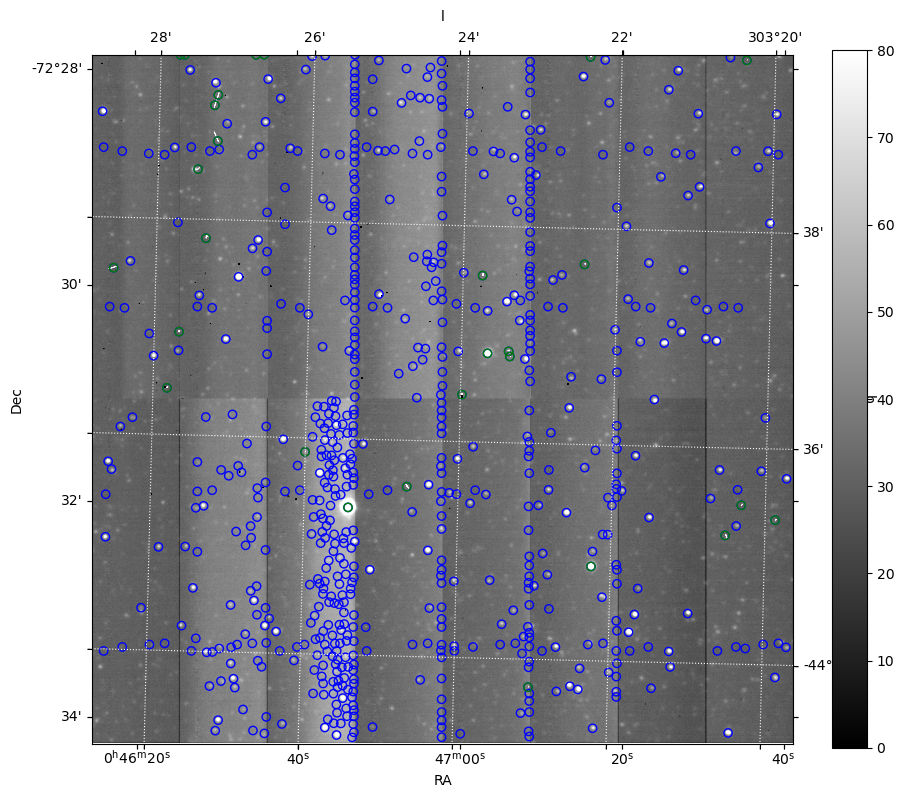

In [139]:
wcs = get_astropy_wcs(image)
fig = plt.figure(figsize=(10, 10))
ax = plt.subplot(projection=wcs)
plt.imshow(image.getImage().getArray(), origin='lower', cmap='binary_r', vmin=0, vmax=80,aspect='equal')
plt.colorbar(fraction=0.045)
plt.scatter(catalog2['base_SdssCentroid_x'], catalog2['base_SdssCentroid_y'], marker="o",facecolors='none', edgecolors='b')
plt.scatter(catalog['base_SdssCentroid_x'], catalog['base_SdssCentroid_y'], marker="o",facecolors='none', edgecolors='g')
plt.xlabel(r'RA')
plt.ylabel(r'Dec')
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)

overlay = ax.get_coords_overlay('galactic')
overlay.grid(color='white', ls='dotted')
